# Transfer Learning with EarlyStopping and Callbacks using TensorFlow
## End-to-End Image Classification on the Kaggle Flowers Recognition Dataset

---

### Overview

This notebook demonstrates a **complete Transfer Learning pipeline** using TensorFlow/Keras.  
It covers every practical step from dataset acquisition through model deployment:

| Phase | Description |
|-------|-------------|
| **1. Setup** | Install dependencies, configure Kaggle API |
| **2. Data** | Download dataset from Kaggle, explore & visualise |
| **3. Preprocessing** | Augmentation, normalisation, train/val/test split |
| **4. Model** | MobileNetV2 base + custom classification head |
| **5. Callbacks** | EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard, CSVLogger |
| **6. Phase 1 Training** | Feature Extraction — frozen base layers |
| **7. Phase 2 Training** | Fine-Tuning — partial unfreezing |
| **8. Evaluation** | Accuracy, loss curves, confusion matrix, classification report |
| **9. Inference** | Predictions on sample images + Grad-CAM heatmaps |

**Dataset:** [Flowers Recognition](https://www.kaggle.com/datasets/alxmamaev/flowers-recognition) — 5 classes (~4,300 images)  
**Base Model:** MobileNetV2 (pre-trained on ImageNet)  
**Framework:** TensorFlow 2.x / Keras

> **Prerequisites:** You need a free [Kaggle account](https://www.kaggle.com/) and your `kaggle.json` API token.  
> See **Cell 4** for setup instructions.

## 1. Environment Setup

In [1]:
# Install required packages (run once; restart kernel if needed)
# Uncomment the line below if running for the first time
# !pip install kaggle tensorflow matplotlib seaborn scikit-learn opencv-python-headless Pillow

import subprocess, sys

required = {
    "kaggle": "kaggle",
    "tensorflow": "tensorflow",
    "matplotlib": "matplotlib",
    "seaborn": "seaborn",
    "sklearn": "scikit-learn",
    "cv2": "opencv-python-headless",
    "PIL": "Pillow",
}

missing = []
for module, package in required.items():
    try:
        __import__(module)
    except ImportError:
        missing.append(package)

if missing:
    print(f"Installing: {missing}")
    subprocess.check_call([sys.executable, "-m", "pip", "install", "--quiet"] + missing)
else:
    print("All packages already installed ✓")

All packages already installed ✓


## 2. Import Libraries

In [2]:
import os
import sys
import zipfile
import shutil
import warnings
import json
import random
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
from PIL import Image
import cv2

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, optimizers, regularizers
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.preprocessing.image import (
    ImageDataGenerator, load_img, img_to_array
)
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ModelCheckpoint,
    ReduceLROnPlateau,
    TensorBoard,
    CSVLogger,
    LambdaCallback,
)
from tensorflow.keras.models import Model

from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay,
)

warnings.filterwarnings("ignore")

# ── Reproducibility ──────────────────────────────────────────────────────────
SEED = 42
os.environ["PYTHONHASHSEED"] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# ── GPU check ────────────────────────────────────────────────────────────────
gpus = tf.config.list_physical_devices("GPU")
print(f"TensorFlow  : {tf.__version__}")
print(f"Keras       : {keras.__version__}")
print(f"GPUs found  : {len(gpus)} — {[g.name for g in gpus] if gpus else 'Training on CPU'}")

# Allow GPU memory growth to avoid OOM errors
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

# ── Plot style ───────────────────────────────────────────────────────────────
plt.rcParams.update({
    "figure.dpi": 100,
    "axes.spines.top": False,
    "axes.spines.right": False,
    "font.family": "DejaVu Sans",
})
print("\nAll libraries imported successfully ✓")

TensorFlow  : 2.21.0
Keras       : 3.15.0
GPUs found  : 0 — Training on CPU

All libraries imported successfully ✓


## 3. Kaggle API Configuration

To download a dataset directly from Kaggle **without manual browser downloads**, you need your Kaggle API key.

### Steps to get your `kaggle.json`:
1. Log in to [https://www.kaggle.com](https://www.kaggle.com)
2. Click your profile picture → **Settings**
3. Scroll to **API** → click **"Create New Token"**
4. A file called `kaggle.json` is downloaded — it contains:  
   `{"username": "your_username", "key": "your_api_key"}`

### Three ways to authenticate (choose one):

**Method A — Upload `kaggle.json` (recommended for local Jupyter)**  
Place it at `~/.kaggle/kaggle.json` (Linux/Mac) or `C:\Users\<name>\.kaggle\kaggle.json` (Windows)

**Method B — Environment variables (recommended for CI/cloud)**  
Set `KAGGLE_USERNAME` and `KAGGLE_KEY` before launching Jupyter.

**Method C — Inline credentials (quick & dirty — do NOT commit to git)**  
Enter credentials directly in the cell below.

## 4. Download and Extract Dataset from Kaggle

In [3]:
# ─── Download the Flowers Recognition dataset from Kaggle ────────────────────
# Dataset: https://www.kaggle.com/datasets/alxmamaev/flowers-recognition
# 5 classes: daisy | dandelion | rose | sunflower | tulip
# ~4,300 images, ~228 MB compressed

DATASET_SLUG = "alxmamaev/flowers-recognition"
DOWNLOAD_DIR = Path("data/raw")
EXTRACT_DIR  = Path("data/flowers")

DOWNLOAD_DIR.mkdir(parents=True, exist_ok=True)

zip_path = DOWNLOAD_DIR / "flowers-recognition.zip"

if not zip_path.exists():
    print(f"Downloading '{DATASET_SLUG}' from Kaggle…")
    os.system(
        f"kaggle datasets download -d {DATASET_SLUG} -p {DOWNLOAD_DIR} --quiet"
    )
    print("Download complete ✓")
else:
    print(f"Zip already exists at {zip_path} — skipping download.")

# ─── Extract ──────────────────────────────────────────────────────────────────
if not EXTRACT_DIR.exists():
    print(f"Extracting to {EXTRACT_DIR}…")
    with zipfile.ZipFile(zip_path, "r") as zf:
        zf.extractall(EXTRACT_DIR)
    print("Extraction complete ✓")
else:
    print(f"Already extracted at {EXTRACT_DIR} — skipping.")

# ─── Locate the class folders ─────────────────────────────────────────────────
# The zip nests files under flowers/flowers/ — find the actual class root
flowers_root = None
for root, dirs, files in os.walk(EXTRACT_DIR):
    if any(d in dirs for d in ["daisy", "dandelion", "rose", "roses",
                               "sunflower", "sunflowers", "tulip", "tulips"]):
        flowers_root = Path(root)
        break

print(f"\nDataset root: {flowers_root}")
print(f"Class folders found:")
for d in sorted(flowers_root.iterdir()):
    if d.is_dir():
        n = len(list(d.glob("*.jpg"))) + len(list(d.glob("*.png")))
        print(f"  {d.name:<15}  {n:>4} images")

Dataset URL: https://www.kaggle.com/datasets/alxmamaev/flowers-recognition
License(s): unknown
Download complete ✓
Extracting to data/flowers…
Extraction complete ✓

Dataset root: data/flowers/flowers
Class folders found:
  daisy             764 images
  dandelion        1052 images
  rose              784 images
  sunflower         733 images
  tulip             984 images


## 5. Organise Data into Train / Validation / Test Splits

We split the raw dataset (no pre-defined splits exist) into:
- **Train:** 70%
- **Validation:** 15%
- **Test:** 15%

In [4]:
# ─── Configuration ────────────────────────────────────────────────────────────
SPLIT_DIR   = Path("data/split")
TRAIN_DIR   = SPLIT_DIR / "train"
VAL_DIR     = SPLIT_DIR / "val"
TEST_DIR    = SPLIT_DIR / "test"

TRAIN_RATIO = 0.70
VAL_RATIO   = 0.15
# TEST_RATIO  = 0.15  (remainder)

IMG_EXTENSIONS = {".jpg", ".jpeg", ".png", ".bmp"}

def create_split(flowers_root: Path, split_dir: Path,
                 train_r=0.70, val_r=0.15, seed=42):
    """Copy images into train/val/test subdirectories preserving class labels."""
    rng = random.Random(seed)

    for class_dir in sorted(flowers_root.iterdir()):
        if not class_dir.is_dir():
            continue
        class_name = class_dir.name.lower().replace(" ", "_")

        images = [
            p for p in class_dir.iterdir()
            if p.suffix.lower() in IMG_EXTENSIONS
        ]
        rng.shuffle(images)

        n      = len(images)
        n_tr   = int(n * train_r)
        n_val  = int(n * val_r)

        splits = {
            "train": images[:n_tr],
            "val"  : images[n_tr : n_tr + n_val],
            "test" : images[n_tr + n_val :],
        }

        for split_name, file_list in splits.items():
            dest = split_dir / split_name / class_name
            dest.mkdir(parents=True, exist_ok=True)
            for src in file_list:
                dst = dest / src.name
                if not dst.exists():
                    shutil.copy2(src, dst)

        print(f"  {class_name:<15}  train={len(splits['train'])}  "
              f"val={len(splits['val'])}  test={len(splits['test'])}")

if not SPLIT_DIR.exists() or not any(SPLIT_DIR.rglob("*.jpg")):
    print("Creating train/val/test split…")
    create_split(flowers_root, SPLIT_DIR, TRAIN_RATIO, VAL_RATIO)
    print("Split complete ✓")
else:
    print("Split already exists — skipping.")
    for class_dir in sorted((SPLIT_DIR / "train").iterdir()):
        class_name = class_dir.name
        n_tr  = len(list((TRAIN_DIR / class_name).glob("*")))
        n_val = len(list((VAL_DIR  / class_name).glob("*")))
        n_te  = len(list((TEST_DIR / class_name).glob("*")))
        print(f"  {class_name:<15}  train={n_tr}  val={n_val}  test={n_te}")

CLASS_NAMES = sorted(d.name for d in TRAIN_DIR.iterdir() if d.is_dir())
NUM_CLASSES = len(CLASS_NAMES)
print(f"\nClasses ({NUM_CLASSES}): {CLASS_NAMES}")

Creating train/val/test split…
  daisy            train=534  val=114  test=116
  dandelion        train=736  val=157  test=159
  rose             train=548  val=117  test=119
  sunflower        train=513  val=109  test=111
  tulip            train=688  val=147  test=149
Split complete ✓

Classes (5): ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']


## 6. Explore and Visualise the Dataset

           train  val  test
class                      
daisy        534  114   116
dandelion    736  157   159
rose         548  117   119
sunflower    513  109   111
tulip        688  147   149
-----------------------------------
train    3019
val       644
test      654


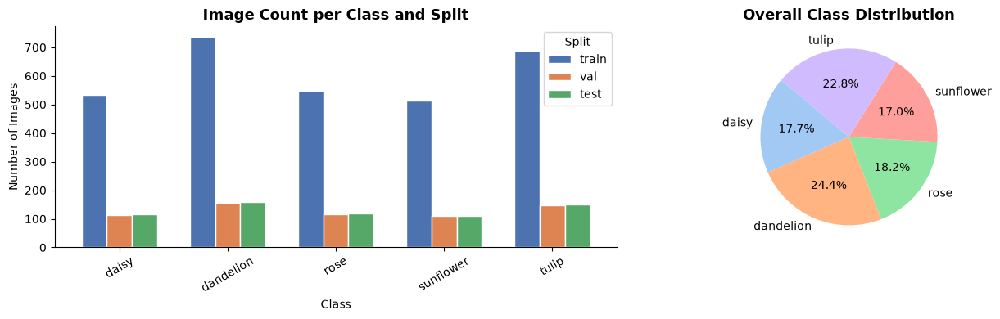

Class distribution chart saved ✓


In [5]:
# ─── Class distribution bar chart ────────────────────────────────────────────
split_counts = {}
for split in ("train", "val", "test"):
    split_counts[split] = {
        cls: len(list((SPLIT_DIR / split / cls).glob("*")))
        for cls in CLASS_NAMES
    }

df_counts = pd.DataFrame(split_counts).rename_axis("class")
total_row  = df_counts.sum().rename("TOTAL")
print(df_counts.to_string())
print("-" * 35)
print(total_row.to_string())

# ── Plot ─────────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 4))

# Stacked bar chart
df_counts.plot(
    kind="bar", ax=axes[0], color=["#4C72B0", "#DD8452", "#55A868"],
    edgecolor="white", width=0.7
)
axes[0].set_title("Image Count per Class and Split", fontsize=13, fontweight="bold")
axes[0].set_xlabel("Class")
axes[0].set_ylabel("Number of Images")
axes[0].tick_params(axis="x", rotation=30)
axes[0].legend(title="Split")

# Pie chart — overall distribution
total_per_class = df_counts.sum(axis=1)
axes[1].pie(
    total_per_class, labels=CLASS_NAMES,
    autopct="%1.1f%%", startangle=140,
    colors=sns.color_palette("pastel", NUM_CLASSES),
)
axes[1].set_title("Overall Class Distribution", fontsize=13, fontweight="bold")

plt.tight_layout()
plt.savefig("class_distribution.png", bbox_inches="tight")
plt.show()
print("Class distribution chart saved ✓")

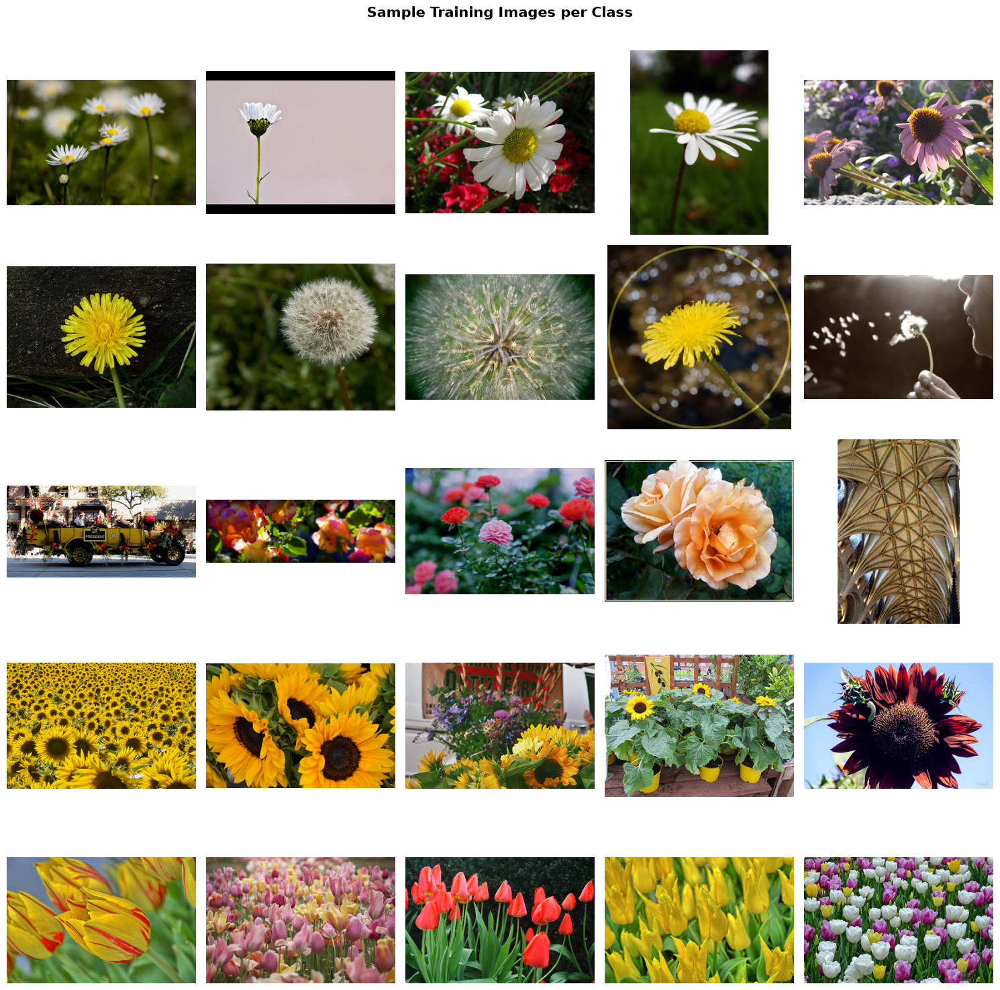

Sample image grid saved ✓


In [6]:
# ─── Display sample images (5 × 5 grid) ──────────────────────────────────────
fig, axes = plt.subplots(NUM_CLASSES, 5, figsize=(15, NUM_CLASSES * 3))
fig.suptitle("Sample Training Images per Class", fontsize=15, fontweight="bold", y=1.01)

for row, cls in enumerate(CLASS_NAMES):
    class_path = TRAIN_DIR / cls
    images = list(class_path.glob("*.jpg"))[:5]

    for col, img_path in enumerate(images):
        img = Image.open(img_path).convert("RGB")
        axes[row, col].imshow(img)
        axes[row, col].axis("off")
        if col == 0:
            axes[row, col].set_ylabel(
                cls.capitalize(), fontsize=11, fontweight="bold",
                rotation=0, labelpad=60, va="center"
            )

plt.tight_layout()
plt.savefig("sample_images.png", bbox_inches="tight")
plt.show()
print("Sample image grid saved ✓")

## 7. Hyperparameters and Configuration

In [7]:
# ─── Central configuration — change any value here to cascade changes ─────────

# Image settings
IMG_HEIGHT   = 224          # MobileNetV2 native input size
IMG_WIDTH    = 224
IMG_SIZE     = (IMG_HEIGHT, IMG_WIDTH)
IMG_CHANNELS = 3
INPUT_SHAPE  = (IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS)

# Training settings — Phase 1 (feature extraction)
BATCH_SIZE       = 32
EPOCHS_PHASE1    = 30       # max epochs; EarlyStopping will cut this short
LR_PHASE1        = 1e-3

# Training settings — Phase 2 (fine-tuning)
EPOCHS_PHASE2    = 20
LR_PHASE2        = 1e-5     # very small LR — avoid destroying pre-trained weights
UNFREEZE_LAYERS  = 30       # number of top layers to unfreeze from MobileNetV2

# Regularisation
DROPOUT_RATE     = 0.30

# Early stopping
ES_PATIENCE      = 7        # stop after N epochs with no val_loss improvement
ES_MIN_DELTA     = 1e-4     # minimum improvement to count as progress

# ReduceLROnPlateau
RLROP_PATIENCE   = 3
RLROP_FACTOR     = 0.5
RLROP_MIN_LR     = 1e-7

# Directories for saved artifacts
CHECKPOINT_DIR = Path("checkpoints")
LOG_DIR        = Path("logs")
CHECKPOINT_DIR.mkdir(exist_ok=True)
LOG_DIR.mkdir(exist_ok=True)

print("Configuration summary:")
print(f"  Input shape    : {INPUT_SHAPE}")
print(f"  Num classes    : {NUM_CLASSES}")
print(f"  Class names    : {CLASS_NAMES}")
print(f"  Batch size     : {BATCH_SIZE}")
print(f"  Phase 1 epochs : {EPOCHS_PHASE1}  (LR={LR_PHASE1})")
print(f"  Phase 2 epochs : {EPOCHS_PHASE2}  (LR={LR_PHASE2})")
print(f"  Unfreeze layers: {UNFREEZE_LAYERS}")
print(f"  Dropout rate   : {DROPOUT_RATE}")
print(f"  ES patience    : {ES_PATIENCE}")

Configuration summary:
  Input shape    : (224, 224, 3)
  Num classes    : 5
  Class names    : ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
  Batch size     : 32
  Phase 1 epochs : 30  (LR=0.001)
  Phase 2 epochs : 20  (LR=1e-05)
  Unfreeze layers: 30
  Dropout rate   : 0.3
  ES patience    : 7


## 8. Data Preprocessing and Augmentation

### Normalisation
MobileNetV2 was trained on ImageNet with `preprocess_input()` — values scaled to `[-1, 1]`.  
We apply this exact same scaling to all three splits to match the distribution the base weights expect.

### Data Augmentation (training only)
Applied **on-the-fly** at training time — the original files are never modified:

| Augmentation | Range |
|---|---|
| Horizontal flip | random |
| Rotation | ±20° |
| Width shift | ±10% |
| Height shift | ±10% |
| Zoom | ±20% |
| Shear | ±15% |
| Brightness | 0.7 – 1.3 |

Validation and test sets use **only normalisation** — no augmentation — to give an honest estimate of generalisation.

In [8]:
# ─── ImageDataGenerator definitions ──────────────────────────────────────────

# Training generator — augmentation + normalisation
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,   # MobileNetV2-specific scaling
    horizontal_flip=True,
    rotation_range=20,
    width_shift_range=0.10,
    height_shift_range=0.10,
    zoom_range=0.20,
    shear_range=0.15,
    brightness_range=[0.70, 1.30],
    fill_mode="nearest",
)

# Validation / Test generators — normalisation only
eval_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
)

# ─── Create flow_from_directory iterators ─────────────────────────────────────
train_gen = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=True,
    seed=SEED,
)

val_gen = eval_datagen.flow_from_directory(
    VAL_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=False,
)

test_gen = eval_datagen.flow_from_directory(
    TEST_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=False,
)

# ─── Sanity check ─────────────────────────────────────────────────────────────
print(f"Class index mapping : {train_gen.class_indices}")
print(f"Train batches       : {len(train_gen)}")
print(f"Val   batches       : {len(val_gen)}")
print(f"Test  batches       : {len(test_gen)}")
print(f"Train samples       : {train_gen.samples}")
print(f"Val   samples       : {val_gen.samples}")
print(f"Test  samples       : {test_gen.samples}")

# Derive ordered class name list from generator
CLASS_LABELS = [k for k, v in sorted(train_gen.class_indices.items(), key=lambda x: x[1])]
print(f"\nOrdered labels      : {CLASS_LABELS}")

Found 3019 images belonging to 5 classes.
Found 644 images belonging to 5 classes.
Found 654 images belonging to 5 classes.
Class index mapping : {'daisy': 0, 'dandelion': 1, 'rose': 2, 'sunflower': 3, 'tulip': 4}
Train batches       : 95
Val   batches       : 21
Test  batches       : 21
Train samples       : 3019
Val   samples       : 644
Test  samples       : 654

Ordered labels      : ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']


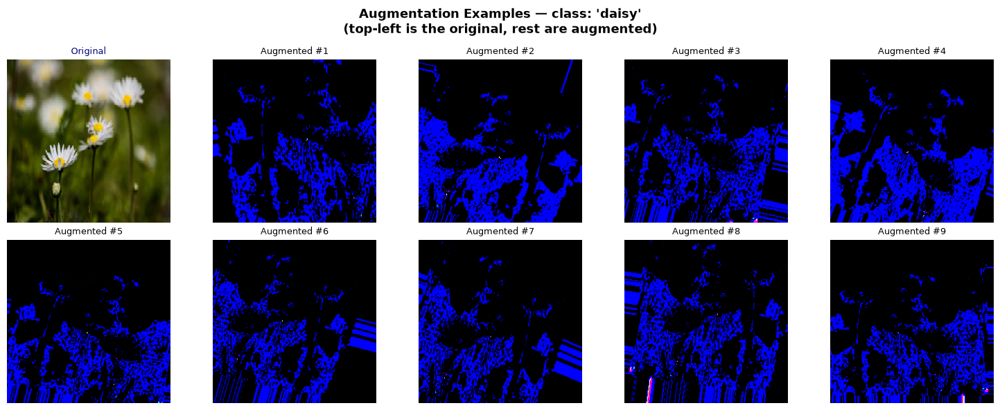

Augmentation visualisation saved ✓


In [9]:
# ─── Visualise augmentation effect side-by-side ──────────────────────────────
# Pick one real image and apply augmentation N times
sample_class = CLASS_LABELS[0]
sample_path  = next((TRAIN_DIR / sample_class).glob("*.jpg"))
original_img = load_img(sample_path, target_size=IMG_SIZE)
img_array    = img_to_array(original_img)
img_batch    = np.expand_dims(img_array, axis=0)

aug_gen = train_datagen.flow(img_batch, batch_size=1, seed=SEED)

fig, axes = plt.subplots(2, 5, figsize=(15, 6))
fig.suptitle(
    f"Augmentation Examples — class: '{sample_class}'\n"
    "(top-left is the original, rest are augmented)",
    fontsize=13, fontweight="bold"
)

for i, ax in enumerate(axes.flat):
    if i == 0:
        ax.imshow(original_img)
        ax.set_title("Original", fontsize=9, color="navy")
    else:
        aug_img = next(aug_gen)[0].astype("uint8")
        ax.imshow(aug_img)
        ax.set_title(f"Augmented #{i}", fontsize=9)
    ax.axis("off")

plt.tight_layout()
plt.savefig("augmentation_examples.png", bbox_inches="tight")
plt.show()
print("Augmentation visualisation saved ✓")

## 9. Transfer Learning Model Architecture

### Why MobileNetV2?
- Trained on **ImageNet** (1.4 M images, 1,000 classes) — rich feature representations
- Lightweight and fast — suitable for training on CPU
- Uses **inverted residuals with linear bottlenecks** — excellent at capturing spatial features
- Input: 224×224×3 — exact same size as our images

### Architecture Strategy

```
Input (224×224×3)
│
├── MobileNetV2 Base (pre-trained, FROZEN in Phase 1)
│     └── 154 layers of deep convolutional feature extraction
│
├── Global Average Pooling 2D
├── Batch Normalisation
├── Dense(256, activation='relu')  +  Dropout(0.30)
├── Dense(128, activation='relu')  +  Dropout(0.20)
└── Dense(5, activation='softmax')   ← our classification head
```

In [10]:
# ─── Load MobileNetV2 base (no top layer) ────────────────────────────────────
base_model = MobileNetV2(
    input_shape=INPUT_SHAPE,
    include_top=False,         # remove original ImageNet classifier
    weights="imagenet",        # load ImageNet pre-trained weights
)
base_model.trainable = False   # freeze all base layers for Phase 1

print(f"Base model          : {base_model.name}")
print(f"Total layers        : {len(base_model.layers)}")
print(f"Trainable params    : {base_model.count_params():,}")
print(f"Base model input    : {base_model.input_shape}")
print(f"Base model output   : {base_model.output_shape}")

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 5s 1us/step
Base model          : mobilenetv2_1.00_224
Total layers        : 154
Trainable params    : 2,257,984
Base model input    : (None, 224, 224, 3)
Base model output   : (None, 7, 7, 1280)


In [11]:
# ─── Build custom classification head ────────────────────────────────────────

def build_model(base_model, num_classes, dropout_rate=0.30):
    """
    Attach a custom classification head on top of a frozen base model.

    Parameters
    ----------
    base_model   : pre-trained Keras model (feature extractor)
    num_classes  : number of output classes
    dropout_rate : dropout probability in the dense layers

    Returns
    -------
    compiled Keras Model
    """
    inputs = keras.Input(shape=INPUT_SHAPE, name="input_layer")

    # Pass through the frozen base
    x = base_model(inputs, training=False)   # training=False keeps BN layers frozen

    # Global Average Pooling — collapses spatial dims to (batch, channels)
    x = layers.GlobalAveragePooling2D(name="global_avg_pool")(x)

    # Batch normalisation to stabilise inputs to the dense layers
    x = layers.BatchNormalization(name="batch_norm_1")(x)

    # First fully-connected block
    x = layers.Dense(256, kernel_regularizer=regularizers.l2(1e-4), name="dense_256")(x)
    x = layers.Activation("relu", name="relu_256")(x)
    x = layers.Dropout(dropout_rate, name="dropout_1")(x)

    # Second fully-connected block
    x = layers.Dense(128, kernel_regularizer=regularizers.l2(1e-4), name="dense_128")(x)
    x = layers.Activation("relu", name="relu_128")(x)
    x = layers.Dropout(dropout_rate * 0.67, name="dropout_2")(x)

    # Output layer — softmax for multi-class classification
    outputs = layers.Dense(num_classes, activation="softmax", name="output_softmax")(x)

    model = Model(inputs=inputs, outputs=outputs, name="MobileNetV2_TransferLearning")
    return model

model = build_model(base_model, NUM_CLASSES, DROPOUT_RATE)

# ─── Summary ──────────────────────────────────────────────────────────────────
model.summary()

total_params     = model.count_params()
trainable_params = sum(
    tf.size(w).numpy() for w in model.trainable_weights
)
frozen_params    = total_params - trainable_params

print(f"\nTotal parameters     : {total_params:>12,}")
print(f"Trainable parameters : {trainable_params:>12,}  ← only the custom head")
print(f"Frozen parameters    : {frozen_params:>12,}  ← MobileNetV2 base")

Model: "MobileNetV2_TransferLearning"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_avg_pool                 │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_norm_1                    │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_256 (Dense)               │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu_256 (Activation)           │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_128 (Dense)               │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu_128 (Activation)           │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_softmax (Dense)          │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,624,581 (10.01 MB)

 Trainable params: 364,037 (1.39 MB)

 Non-trainable params: 2,260,544 (8.62 MB)


Total parameters     :    2,624,581
Trainable parameters :      364,037  ← only the custom head
Frozen parameters    :    2,260,544  ← MobileNetV2 base


## 10. Defining Callbacks

Callbacks are objects that execute custom logic at specific points during training.  
We use six complementary callbacks — each serving a distinct purpose:

| Callback | Role |
|---|---|
| **EarlyStopping** | Halts training when `val_loss` stops improving, preventing overfitting and wasted compute |
| **ModelCheckpoint** | Saves the weights of the *best* epoch to disk — decouples best model from final epoch |
| **ReduceLROnPlateau** | Automatically reduces the learning rate when a plateau is detected |
| **TensorBoard** | Writes training metrics to a log directory for interactive visualisation |
| **CSVLogger** | Appends per-epoch metrics to a CSV file — useful for post-training analysis |
| **LambdaCallback** | Custom inline callback — prints a concise epoch summary to stdout |

In [12]:
# ─── Callback definitions ─────────────────────────────────────────────────────

# 1. EarlyStopping ─────────────────────────────────────────────────────────────
#    Monitors val_loss; stops training if no improvement > min_delta for 'patience' epochs.
#    restore_best_weights=True: reverts model weights to the epoch with the best val_loss.
early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=ES_PATIENCE,
    min_delta=ES_MIN_DELTA,
    mode="min",
    restore_best_weights=True,
    verbose=1,
)

# 2. ModelCheckpoint ───────────────────────────────────────────────────────────
#    Saves model weights only when val_accuracy improves.
#    save_best_only=True: does not overwrite unless the new checkpoint is strictly better.
checkpoint_path_p1 = str(CHECKPOINT_DIR / "best_phase1.keras")
model_checkpoint_p1 = ModelCheckpoint(
    filepath=checkpoint_path_p1,
    monitor="val_accuracy",
    mode="max",
    save_best_only=True,
    save_weights_only=False,   # save full model (architecture + weights + optimiser state)
    verbose=1,
)

# 3. ReduceLROnPlateau ─────────────────────────────────────────────────────────
#    Multiplies current LR by 'factor' when val_loss does not improve for 'patience' epochs.
#    min_lr caps the reduction so LR never becomes negligibly tiny.
reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",
    factor=RLROP_FACTOR,
    patience=RLROP_PATIENCE,
    min_delta=ES_MIN_DELTA,
    min_lr=RLROP_MIN_LR,
    mode="min",
    verbose=1,
)

# 4. TensorBoard ───────────────────────────────────────────────────────────────
#    Logs scalars, histograms, and the computation graph.
#    Launch with:  tensorboard --logdir logs/phase1
tensorboard_p1 = TensorBoard(
    log_dir=str(LOG_DIR / "phase1"),
    histogram_freq=1,          # log weight histograms every epoch
    write_graph=True,
    write_images=False,
    update_freq="epoch",
    profile_batch=0,           # disable profiling to keep logs lightweight
)

# 5. CSVLogger ─────────────────────────────────────────────────────────────────
#    Streams per-epoch loss/accuracy to a CSV file for offline analysis.
csv_logger_p1 = CSVLogger(
    filename="logs/training_phase1.csv",
    separator=",",
    append=False,
)

# 6. LambdaCallback ────────────────────────────────────────────────────────────
#    Custom inline logic: prints a concise per-epoch summary line to stdout.
def on_epoch_end_summary(epoch, logs):
    lr = float(tf.keras.backend.get_value(model.optimizer.learning_rate))
    print(
        f"  [Epoch {epoch+1:03d}]  "
        f"loss={logs['loss']:.4f}  acc={logs['accuracy']:.4f}  "
        f"val_loss={logs['val_loss']:.4f}  val_acc={logs['val_accuracy']:.4f}  "
        f"lr={lr:.2e}"
    )

epoch_summary = LambdaCallback(on_epoch_end=on_epoch_end_summary)

# ─── Bundle Phase 1 callbacks ─────────────────────────────────────────────────
CALLBACKS_PHASE1 = [
    early_stopping,
    model_checkpoint_p1,
    reduce_lr,
    tensorboard_p1,
    csv_logger_p1,
    epoch_summary,
]

print("All callbacks defined ✓")
print("\nPhase 1 callback stack:")
for cb in CALLBACKS_PHASE1:
    print(f"  • {cb.__class__.__name__}")

All callbacks defined ✓

Phase 1 callback stack:
  • EarlyStopping
  • ModelCheckpoint
  • ReduceLROnPlateau
  • TensorBoard
  • CSVLogger
  • LambdaCallback


## 11. Phase 1 — Feature Extraction

In this phase the **entire MobileNetV2 base is frozen** — only the custom head trains.  
The pre-trained convolutional filters act as a fixed feature extractor.

This is efficient because:
- Gradient computation only flows through the small custom head (~300K params vs 2.2M total)
- Training is fast even on CPU
- The base already captures powerful general-purpose visual features (edges, textures, shapes)

In [13]:
# ─── Compile ──────────────────────────────────────────────────────────────────
model.compile(
    optimizer=optimizers.Adam(learning_rate=LR_PHASE1),
    loss="categorical_crossentropy",
    metrics=["accuracy"],
)

print(f"Optimizer : Adam  (lr={LR_PHASE1})")
print(f"Loss      : categorical_crossentropy")
print(f"Metrics   : accuracy")
print(f"\nStarting Phase 1 — Feature Extraction (max {EPOCHS_PHASE1} epochs)…")
print("=" * 65)

Optimizer : Adam  (lr=0.001)
Loss      : categorical_crossentropy
Metrics   : accuracy

Starting Phase 1 — Feature Extraction (max 30 epochs)…


In [16]:
# ─── Train Phase 1 ────────────────────────────────────────────────────────────
history_p1 = model.fit(
    train_gen,
    steps_per_epoch=len(train_gen),
    validation_data=val_gen,
    validation_steps=len(val_gen),
    epochs=EPOCHS_PHASE1,
    callbacks=CALLBACKS_PHASE1,
    verbose=0,             # suppress Keras default — our LambdaCallback prints instead
)

print("\n" + "=" * 65)
print(f"Phase 1 complete.  Ran {len(history_p1.epoch)} epochs.")
print(f"Best val_accuracy  : {max(history_p1.history['val_accuracy']):.4f}")
print(f"Best val_loss      : {min(history_p1.history['val_loss']):.4f}")
print(f"EarlyStopping      : {'triggered' if len(history_p1.epoch) < EPOCHS_PHASE1 else 'not triggered'}")


Epoch 1: val_accuracy improved from None to 0.86180, saving model to checkpoints/best_phase1.keras

Epoch 1: finished saving model to checkpoints/best_phase1.keras
  [Epoch 001]  loss=0.7700  acc=0.7440  val_loss=0.4472  val_acc=0.8618  lr=1.00e-03

Epoch 2: val_accuracy improved from 0.86180 to 0.89907, saving model to checkpoints/best_phase1.keras

Epoch 2: finished saving model to checkpoints/best_phase1.keras
  [Epoch 002]  loss=0.5133  acc=0.8443  val_loss=0.3572  val_acc=0.8991  lr=1.00e-03

Epoch 3: val_accuracy did not improve from 0.89907
  [Epoch 003]  loss=0.4378  acc=0.8665  val_loss=0.3633  val_acc=0.8898  lr=1.00e-03

Epoch 4: val_accuracy improved from 0.89907 to 0.91149, saving model to checkpoints/best_phase1.keras

Epoch 4: finished saving model to checkpoints/best_phase1.keras
  [Epoch 004]  loss=0.3958  acc=0.8811  val_loss=0.3443  val_acc=0.9115  lr=1.00e-03

Epoch 5: val_accuracy did not improve from 0.91149
  [Epoch 005]  loss=0.3677  acc=0.8854  val_loss=0.3834

### 11.1 Training Curves — Phase 1

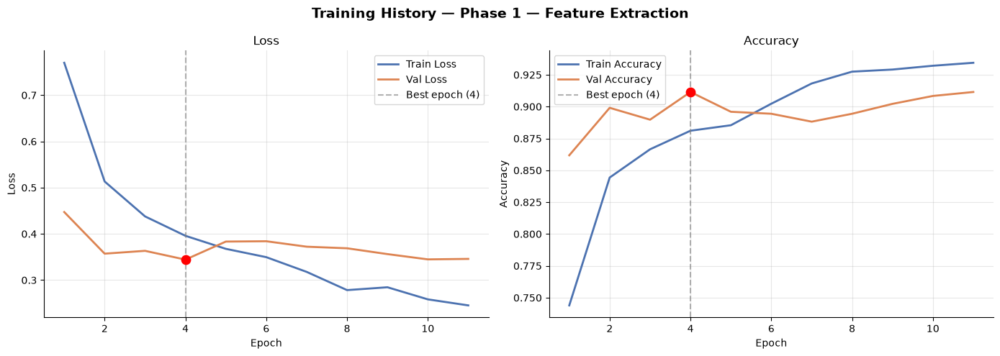

Phase 1 training curves saved ✓


In [17]:
def plot_history(history, title_prefix="Phase 1", save_path=None):
    """Plot training & validation loss and accuracy side-by-side."""
    hist    = history.history
    epochs  = range(1, len(hist["loss"]) + 1)
    best_ep = np.argmin(hist["val_loss"]) + 1

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle(f"Training History — {title_prefix}", fontsize=14, fontweight="bold")

    # ── Loss ──────────────────────────────────────────────────────────────────
    axes[0].plot(epochs, hist["loss"],     label="Train Loss",      color="#4C72B0", lw=2)
    axes[0].plot(epochs, hist["val_loss"], label="Val Loss",         color="#DD8452", lw=2)
    axes[0].axvline(best_ep, linestyle="--", color="grey", alpha=0.6, label=f"Best epoch ({best_ep})")
    axes[0].scatter(best_ep, hist["val_loss"][best_ep-1], zorder=5, color="red", s=80)
    axes[0].set_xlabel("Epoch")
    axes[0].set_ylabel("Loss")
    axes[0].set_title("Loss")
    axes[0].legend()
    axes[0].grid(alpha=0.3)

    # ── Accuracy ──────────────────────────────────────────────────────────────
    axes[1].plot(epochs, hist["accuracy"],     label="Train Accuracy",  color="#4C72B0", lw=2)
    axes[1].plot(epochs, hist["val_accuracy"], label="Val Accuracy",    color="#DD8452", lw=2)
    axes[1].axvline(best_ep, linestyle="--", color="grey", alpha=0.6, label=f"Best epoch ({best_ep})")
    axes[1].scatter(best_ep, hist["val_accuracy"][best_ep-1], zorder=5, color="red", s=80)
    axes[1].set_xlabel("Epoch")
    axes[1].set_ylabel("Accuracy")
    axes[1].set_title("Accuracy")
    axes[1].legend()
    axes[1].grid(alpha=0.3)

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, bbox_inches="tight")
    plt.show()

plot_history(history_p1, title_prefix="Phase 1 — Feature Extraction",
             save_path="training_curves_phase1.png")
print("Phase 1 training curves saved ✓")

## 12. Phase 2 — Fine-Tuning

Now we **selectively unfreeze the top layers of the base model** and train end-to-end.

### Why Fine-Tune?
The early layers of MobileNetV2 detect general features (edges, colours, gradients) that transfer well across all domains.  
The **upper layers** encode more task-specific patterns — fine-tuning these on our flower dataset lets the network adapt to our specific classes.

### Key Precautions
- Use a **very small learning rate** (`1e-5`) — large updates would corrupt the carefully tuned pre-trained weights (sometimes called "catastrophic forgetting")
- Unfreeze only the **top N layers** (we use 30) — the lower layers stay frozen
- Compile with a fresh optimiser — the Phase 1 optimiser state (Adam momentum) can mislead fine-tuning

In [18]:
# ─── Unfreeze the top UNFREEZE_LAYERS of the base model ──────────────────────

# First ensure all layers are frozen, then selectively unfreeze
base_model.trainable = True

total_base_layers = len(base_model.layers)
freeze_until      = total_base_layers - UNFREEZE_LAYERS

for i, layer in enumerate(base_model.layers):
    layer.trainable = (i >= freeze_until)

# ── Report ────────────────────────────────────────────────────────────────────
trainable_after   = sum(1 for l in base_model.layers if l.trainable)
frozen_after      = total_base_layers - trainable_after

print(f"Total base layers          : {total_base_layers}")
print(f"Frozen layers (unchanged)  : {frozen_after}")
print(f"Unfrozen (fine-tunable)    : {trainable_after}")
print(f"\nFine-tuning from layer     : {freeze_until} ({base_model.layers[freeze_until].name})")

# ── Show which layers are now trainable ───────────────────────────────────────
print("\nTrainable base layers:")
for i, layer in enumerate(base_model.layers):
    if layer.trainable:
        print(f"  [{i:>3}] {layer.name}")

Total base layers          : 154
Frozen layers (unchanged)  : 124
Unfrozen (fine-tunable)    : 30

Fine-tuning from layer     : 124 (block_13_project_BN)

Trainable base layers:
  [124] block_13_project_BN
  [125] block_14_expand
  [126] block_14_expand_BN
  [127] block_14_expand_relu
  [128] block_14_depthwise
  [129] block_14_depthwise_BN
  [130] block_14_depthwise_relu
  [131] block_14_project
  [132] block_14_project_BN
  [133] block_14_add
  [134] block_15_expand
  [135] block_15_expand_BN
  [136] block_15_expand_relu
  [137] block_15_depthwise
  [138] block_15_depthwise_BN
  [139] block_15_depthwise_relu
  [140] block_15_project
  [141] block_15_project_BN
  [142] block_15_add
  [143] block_16_expand
  [144] block_16_expand_BN
  [145] block_16_expand_relu
  [146] block_16_depthwise
  [147] block_16_depthwise_BN
  [148] block_16_depthwise_relu
  [149] block_16_project
  [150] block_16_project_BN
  [151] Conv_1
  [152] Conv_1_bn
  [153] out_relu


In [19]:
# ─── New checkpoint for Phase 2 ──────────────────────────────────────────────
checkpoint_path_p2 = str(CHECKPOINT_DIR / "best_phase2.keras")
model_checkpoint_p2 = ModelCheckpoint(
    filepath=checkpoint_path_p2,
    monitor="val_accuracy",
    mode="max",
    save_best_only=True,
    verbose=1,
)

tensorboard_p2 = TensorBoard(
    log_dir=str(LOG_DIR / "phase2"),
    histogram_freq=1,
    update_freq="epoch",
    profile_batch=0,
)

csv_logger_p2 = CSVLogger(
    filename="logs/training_phase2.csv",
    separator=",",
    append=False,
)

# Reset EarlyStopping and ReduceLROnPlateau for Phase 2
early_stopping_p2 = EarlyStopping(
    monitor="val_loss",
    patience=ES_PATIENCE,
    min_delta=ES_MIN_DELTA,
    mode="min",
    restore_best_weights=True,
    verbose=1,
)

reduce_lr_p2 = ReduceLROnPlateau(
    monitor="val_loss",
    factor=RLROP_FACTOR,
    patience=RLROP_PATIENCE,
    min_lr=RLROP_MIN_LR,
    mode="min",
    verbose=1,
)

CALLBACKS_PHASE2 = [
    early_stopping_p2,
    model_checkpoint_p2,
    reduce_lr_p2,
    tensorboard_p2,
    csv_logger_p2,
    epoch_summary,
]

# ── Recompile with a much smaller learning rate ────────────────────────────────
model.compile(
    optimizer=optimizers.Adam(learning_rate=LR_PHASE2),
    loss="categorical_crossentropy",
    metrics=["accuracy"],
)

total_trainable = sum(tf.size(w).numpy() for w in model.trainable_weights)
print(f"Recompiled.  Trainable parameters: {total_trainable:,}")
print(f"Learning rate for fine-tuning    : {LR_PHASE2}")
print(f"\nStarting Phase 2 — Fine-Tuning (max {EPOCHS_PHASE2} epochs)…")
print("=" * 65)

Recompiled.  Trainable parameters: 1,890,437
Learning rate for fine-tuning    : 1e-05

Starting Phase 2 — Fine-Tuning (max 20 epochs)…


In [20]:
# ─── Train Phase 2 ────────────────────────────────────────────────────────────
history_p2 = model.fit(
    train_gen,
    steps_per_epoch=len(train_gen),
    validation_data=val_gen,
    validation_steps=len(val_gen),
    epochs=EPOCHS_PHASE2,
    callbacks=CALLBACKS_PHASE2,
    verbose=0,
)

print("\n" + "=" * 65)
print(f"Phase 2 complete.  Ran {len(history_p2.epoch)} epochs.")
print(f"Best val_accuracy  : {max(history_p2.history['val_accuracy']):.4f}")
print(f"Best val_loss      : {min(history_p2.history['val_loss']):.4f}")
print(f"EarlyStopping      : {'triggered' if len(history_p2.epoch) < EPOCHS_PHASE2 else 'not triggered'}")


Epoch 1: val_accuracy improved from None to 0.89907, saving model to checkpoints/best_phase2.keras

Epoch 1: finished saving model to checkpoints/best_phase2.keras
  [Epoch 001]  loss=0.4931  acc=0.8403  val_loss=0.3880  val_acc=0.8991  lr=1.00e-05

Epoch 2: val_accuracy did not improve from 0.89907
  [Epoch 002]  loss=0.4396  acc=0.8625  val_loss=0.3998  val_acc=0.8929  lr=1.00e-05

Epoch 3: val_accuracy did not improve from 0.89907
  [Epoch 003]  loss=0.3993  acc=0.8741  val_loss=0.4072  val_acc=0.8929  lr=1.00e-05

Epoch 4: val_accuracy did not improve from 0.89907
  [Epoch 004]  loss=0.3938  acc=0.8784  val_loss=0.3869  val_acc=0.8991  lr=1.00e-05

Epoch 5: val_accuracy did not improve from 0.89907
  [Epoch 005]  loss=0.3601  acc=0.8976  val_loss=0.3847  val_acc=0.8944  lr=1.00e-05

Epoch 6: val_accuracy did not improve from 0.89907
  [Epoch 006]  loss=0.3314  acc=0.9039  val_loss=0.3791  val_acc=0.8991  lr=1.00e-05

Epoch 7: val_accuracy did not improve from 0.89907
  [Epoch 007]

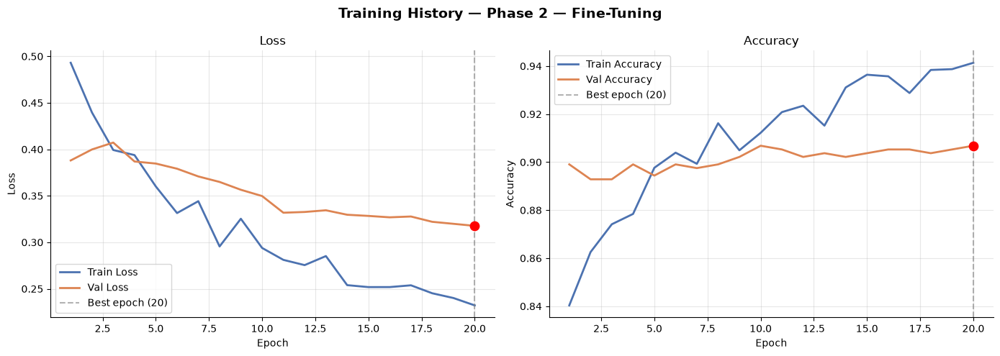

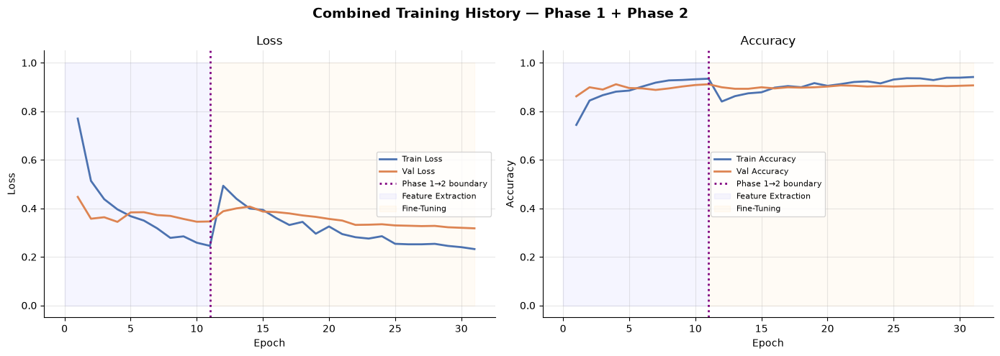

Combined training curves saved ✓


In [21]:
# ─── Plot Phase 2 curves ──────────────────────────────────────────────────────
plot_history(history_p2, title_prefix="Phase 2 — Fine-Tuning",
             save_path="training_curves_phase2.png")

# ─── Combined view (Phase 1 + Phase 2 concatenated) ──────────────────────────
def plot_combined_history(h1, h2, save_path=None):
    """Show the full training run across both phases with a dividing line."""
    keys      = ["loss", "val_loss", "accuracy", "val_accuracy"]
    combined  = {k: h1.history[k] + h2.history[k] for k in keys}
    ep_all    = range(1, len(combined["loss"]) + 1)
    phase1_end = len(h1.history["loss"])

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle("Combined Training History — Phase 1 + Phase 2",
                 fontsize=14, fontweight="bold")

    for ax, (metric_train, metric_val, ylabel) in zip(axes, [
        ("loss",     "val_loss",     "Loss"),
        ("accuracy", "val_accuracy", "Accuracy"),
    ]):
        ax.plot(ep_all, combined[metric_train], label=f"Train {ylabel}", color="#4C72B0", lw=2)
        ax.plot(ep_all, combined[metric_val],   label=f"Val {ylabel}",   color="#DD8452", lw=2)
        ax.axvline(phase1_end, linestyle=":", color="purple", lw=2, label="Phase 1→2 boundary")
        ax.fill_betweenx([0, 1], 0, phase1_end, alpha=0.04, color="blue",
                         label="Feature Extraction")
        ax.fill_betweenx([0, 1], phase1_end, max(ep_all), alpha=0.04, color="orange",
                         label="Fine-Tuning")
        ax.set_xlabel("Epoch")
        ax.set_ylabel(ylabel)
        ax.set_title(ylabel)
        ax.legend(fontsize=8)
        ax.grid(alpha=0.3)

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, bbox_inches="tight")
    plt.show()

plot_combined_history(history_p1, history_p2,
                      save_path="training_curves_combined.png")
print("Combined training curves saved ✓")

## 13. Model Evaluation on the Held-Out Test Set

In [22]:
# ─── Evaluate on test set ─────────────────────────────────────────────────────
print("Evaluating on test set…")
test_loss, test_accuracy = model.evaluate(
    test_gen, steps=len(test_gen), verbose=1
)

print(f"\n{'='*45}")
print(f"  Test Loss     : {test_loss:.4f}")
print(f"  Test Accuracy : {test_accuracy:.4f}  ({test_accuracy*100:.2f}%)")
print(f"{'='*45}")

Evaluating on test set…
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - accuracy: 0.8914 - loss: 0.3734

  Test Loss     : 0.3734
  Test Accuracy : 0.8914  (89.14%)


In [23]:
# ─── Collect true labels and predictions ─────────────────────────────────────
test_gen.reset()

y_pred_probs = model.predict(test_gen, steps=len(test_gen), verbose=1)
y_pred       = np.argmax(y_pred_probs, axis=1)
y_true       = test_gen.classes[:len(y_pred)]   # align lengths

print(f"Predictions  shape : {y_pred_probs.shape}")
print(f"True labels  shape : {y_true.shape}")
print(f"Unique predicted classes : {np.unique(y_pred)}")

21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step
Predictions  shape : (654, 5)
True labels  shape : (654,)
Unique predicted classes : [0 1 2 3 4]


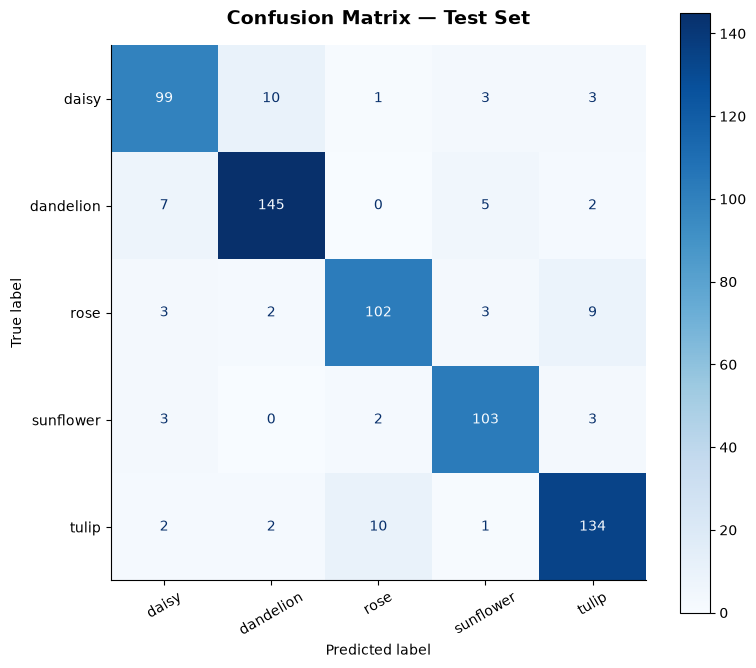


Per-class accuracy from confusion matrix:
  daisy           99/ 116  (85.3%)
  dandelion       145/ 159  (91.2%)
  rose            102/ 119  (85.7%)
  sunflower       103/ 111  (92.8%)
  tulip           134/ 149  (89.9%)


In [24]:
# ─── Confusion Matrix ─────────────────────────────────────────────────────────
cm_matrix = confusion_matrix(y_true, y_pred)

fig, ax = plt.subplots(figsize=(8, 7))
disp = ConfusionMatrixDisplay(confusion_matrix=cm_matrix, display_labels=CLASS_LABELS)
disp.plot(
    ax=ax,
    colorbar=True,
    cmap="Blues",
    xticks_rotation=30,
)
ax.set_title("Confusion Matrix — Test Set", fontsize=14, fontweight="bold", pad=15)
plt.tight_layout()
plt.savefig("confusion_matrix.png", bbox_inches="tight")
plt.show()

# Per-class accuracy from confusion matrix
print("\nPer-class accuracy from confusion matrix:")
for i, cls in enumerate(CLASS_LABELS):
    row_sum = cm_matrix[i].sum()
    correct = cm_matrix[i, i]
    print(f"  {cls:<15} {correct}/{row_sum:>4}  ({100*correct/row_sum:.1f}%)")

Classification Report — Test Set
              precision    recall  f1-score   support

       daisy     0.8684    0.8534    0.8609       116
   dandelion     0.9119    0.9119    0.9119       159
        rose     0.8870    0.8571    0.8718       119
   sunflower     0.8957    0.9279    0.9115       111
       tulip     0.8874    0.8993    0.8933       149

    accuracy                         0.8914       654
   macro avg     0.8901    0.8900    0.8899       654
weighted avg     0.8913    0.8914    0.8913       654



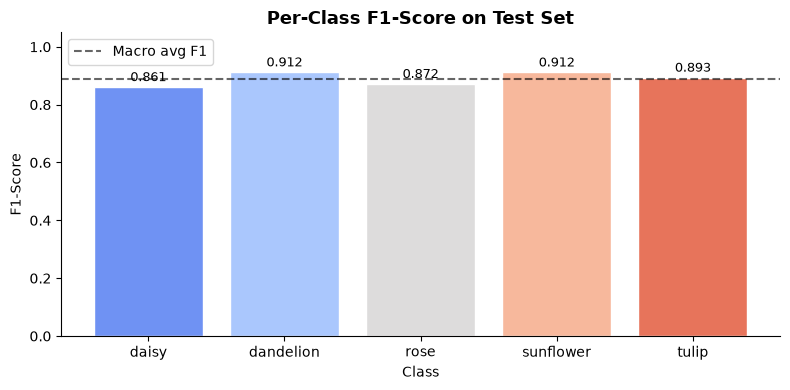

F1-score chart saved ✓


In [25]:
# ─── Full Classification Report ───────────────────────────────────────────────
report = classification_report(
    y_true, y_pred,
    target_names=CLASS_LABELS,
    digits=4,
    output_dict=False,
)
print("Classification Report — Test Set")
print("=" * 65)
print(report)

# Also capture as dict for programmatic access
report_dict = classification_report(
    y_true, y_pred,
    target_names=CLASS_LABELS,
    digits=4,
    output_dict=True,
)

# ── Visualise per-class F1 score ──────────────────────────────────────────────
f1_scores = {cls: report_dict[cls]["f1-score"] for cls in CLASS_LABELS}
fig, ax = plt.subplots(figsize=(8, 4))
bars = ax.bar(f1_scores.keys(), f1_scores.values(),
              color=sns.color_palette("coolwarm", NUM_CLASSES), edgecolor="white")
ax.axhline(report_dict["macro avg"]["f1-score"], linestyle="--",
           color="black", alpha=0.6, label="Macro avg F1")
ax.set_ylim(0, 1.05)
ax.set_xlabel("Class")
ax.set_ylabel("F1-Score")
ax.set_title("Per-Class F1-Score on Test Set", fontsize=13, fontweight="bold")
ax.legend()
for bar, val in zip(bars, f1_scores.values()):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
            f"{val:.3f}", ha="center", va="bottom", fontsize=9)
plt.tight_layout()
plt.savefig("f1_scores.png", bbox_inches="tight")
plt.show()
print("F1-score chart saved ✓")

## 14. Predictions on Sample Images

We visualise individual test-set predictions — correct ones in green, wrong in red.  
The confidence bar beneath each image shows the predicted class probability.

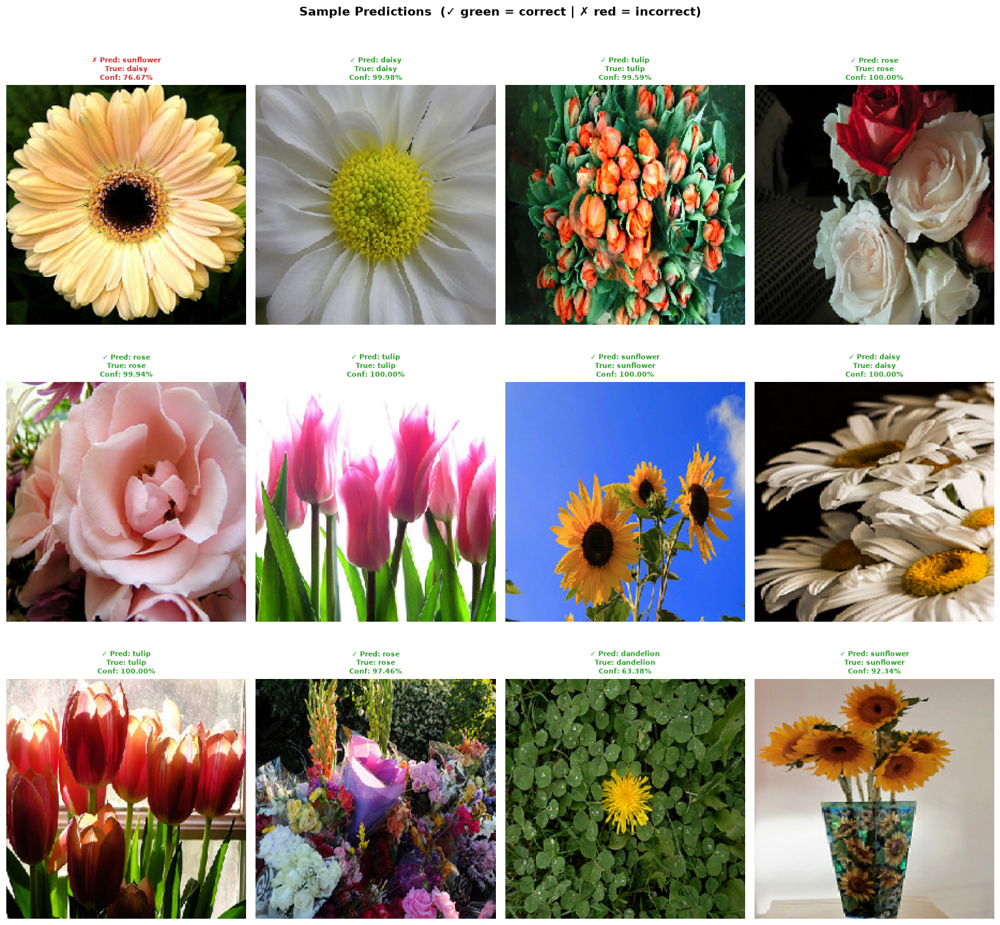

Sample predictions grid saved ✓


In [26]:
# ─── Sample prediction grid ───────────────────────────────────────────────────

def predict_and_display(model, image_paths, true_labels, class_labels, n=12):
    """Display n images with predicted vs true labels and confidence bars."""
    n   = min(n, len(image_paths))
    fig = plt.figure(figsize=(16, n // 4 * 5))
    fig.suptitle("Sample Predictions  (✓ green = correct | ✗ red = incorrect)",
                 fontsize=14, fontweight="bold", y=1.01)

    for idx in range(n):
        img_path   = image_paths[idx]
        true_label = true_labels[idx]

        # Load and preprocess
        img     = load_img(img_path, target_size=IMG_SIZE)
        arr     = img_to_array(img)
        arr_pre = preprocess_input(arr.copy())
        probs   = model.predict(np.expand_dims(arr_pre, 0), verbose=0)[0]
        pred_idx = np.argmax(probs)
        confidence = probs[pred_idx]
        correct    = (pred_idx == true_label)

        ax = fig.add_subplot(n // 4, 4, idx + 1)
        ax.imshow(img)
        ax.axis("off")

        color = "#2ca02c" if correct else "#d62728"
        mark  = "✓" if correct else "✗"
        ax.set_title(
            f"{mark} Pred: {class_labels[pred_idx]}\nTrue: {class_labels[true_label]}\nConf: {confidence:.2%}",
            fontsize=8, color=color, fontweight="bold"
        )

    plt.tight_layout()
    plt.savefig("sample_predictions.png", bbox_inches="tight")
    plt.show()


# Gather test image paths and labels
test_image_paths = []
test_labels_list = []
for cls_idx, cls in enumerate(CLASS_LABELS):
    for img_path in sorted((TEST_DIR / cls).glob("*.jpg"))[:3]:   # 3 per class
        test_image_paths.append(img_path)
        test_labels_list.append(cls_idx)

# Shuffle for variety
combined_pairs = list(zip(test_image_paths, test_labels_list))
random.shuffle(combined_pairs)
test_image_paths, test_labels_list = zip(*combined_pairs)

predict_and_display(model, test_image_paths, test_labels_list,
                    CLASS_LABELS, n=min(12, len(test_image_paths)))
print("Sample predictions grid saved ✓")

## 15. Grad-CAM — Visual Explanation of Model Decisions

**Gradient-weighted Class Activation Mapping (Grad-CAM)** highlights the image regions  
that most influenced the model's prediction.

### How it works:
1. Register a hook on the **last convolutional layer** of the base model
2. Do a forward pass; identify the predicted class score
3. Backpropagate gradients only from that class score to the chosen layer
4. Pool the gradients spatially (Global Average Pool) → one importance weight per channel
5. Weight the activation maps by these importance scores → sum to get a raw heatmap
6. Apply ReLU (only positive influences), then resize to input resolution
7. Overlay the heatmap on the original image

> Grad-CAM [Selvaraju et al., 2017] provides class-discriminative localisation without any architectural modification.

In [28]:
# ─── Grad-CAM implementation ──────────────────────────────────────────────────

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    """
    Compute a Grad-CAM heatmap for the given image.

    Parameters
    ----------
    img_array          : preprocessed image array, shape (1, H, W, C)
    model              : full Keras model
    last_conv_layer_name : name of the final convolutional layer
    pred_index         : class index to explain; uses argmax if None

    Returns
    -------
    heatmap : 2-D numpy array, values in [0, 1]
    """
    # Find the base model layer inside the outer model if nested
    base_model = None
    for layer in model.layers:
        if isinstance(layer, keras.Model) or (hasattr(layer, "layers") and len(layer.layers) > 0):
            base_model = layer
            break

    if base_model is not None:
        # If it is a nested model, trace through base_model
        grad_model = Model(
            inputs=base_model.inputs,
            outputs=[
                base_model.get_layer(last_conv_layer_name).output,
                base_model.output,
            ],
        )
        with tf.GradientTape() as tape:
            conv_outputs, base_out = grad_model([img_array], training=False)
            tape.watch(conv_outputs)

            # Forward pass through subsequent custom head layers
            x = base_out
            base_model_idx = model.layers.index(base_model)
            for layer in model.layers[base_model_idx + 1:]:
                x = layer(x, training=False)
            predictions = x

            if pred_index is None:
                pred_index = tf.argmax(predictions[0])
            class_channel = predictions[:, pred_index]

        grads = tape.gradient(class_channel, conv_outputs)
    else:
        # Flat model
        grad_model = Model(
            inputs=model.inputs,
            outputs=[
                model.get_layer(last_conv_layer_name).output,
                model.output,
            ],
        )
        with tf.GradientTape() as tape:
            conv_outputs, predictions = grad_model(img_array, training=False)
            if pred_index is None:
                pred_index = tf.argmax(predictions[0])
            class_channel = predictions[:, pred_index]

        grads = tape.gradient(class_channel, conv_outputs)

    # Pool gradients over spatial dimensions
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))  # shape (filters,)

    # Weight each channel of the feature map by its importance
    conv_outputs = conv_outputs[0]                         # (h, w, filters)
    heatmap      = conv_outputs @ pooled_grads[..., tf.newaxis]  # (h, w, 1)
    heatmap      = tf.squeeze(heatmap)                     # (h, w)

    # ReLU + normalise to [0, 1]
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-8)
    return heatmap.numpy()


def overlay_gradcam(img_path, heatmap, alpha=0.45):
    """Resize heatmap and overlay it as a jet colourmap on the original image."""
    img    = cv2.imread(str(img_path))
    img    = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img    = cv2.resize(img, IMG_SIZE)

    heatmap_resized = cv2.resize(heatmap, IMG_SIZE)
    heatmap_uint8   = np.uint8(255 * heatmap_resized)
    jet_heatmap     = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
    jet_heatmap     = cv2.cvtColor(jet_heatmap, cv2.COLOR_BGR2RGB)

    superimposed = (jet_heatmap * alpha + img * (1 - alpha)).astype("uint8")
    return img, superimposed


# ─── Find the last conv layer name in the base model ──────────────────────────
last_conv_layer_name = None
for layer in reversed(base_model.layers):
    if isinstance(layer, layers.Conv2D):
        last_conv_layer_name = layer.name
        break

# Build a Grad-CAM model targeting the base model only to avoid nested graph tracing issues in Keras 3.
grad_model_full = Model(
    inputs=base_model.inputs,
    outputs=[
        base_model.get_layer(last_conv_layer_name).output,
        base_model.output,
    ],
)

print(f"Last conv layer for Grad-CAM : {last_conv_layer_name}")


def compute_gradcam_full(img_path, grad_model, pred_index=None):
    """Wrapper that uses the pre-built grad_model_full (base_model-level) and passes the output to the custom head."""
    img       = load_img(img_path, target_size=IMG_SIZE)
    arr       = img_to_array(img)
    arr_pre   = preprocess_input(arr.copy())
    img_batch = np.expand_dims(arr_pre, 0)

    with tf.GradientTape() as tape:
        # 1. Forward pass through the base model
        conv_outs, base_out = grad_model([img_batch], training=False)
        tape.watch(conv_outs)

        # 2. Forward pass through the subsequent custom head layers
        x = base_out
        base_model_idx = model.layers.index(base_model)
        for layer in model.layers[base_model_idx + 1:]:
            x = layer(x, training=False)
        preds = x

        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_ch = preds[:, pred_index]

    grads       = tape.gradient(class_ch, conv_outs)
    pooled_g    = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outs   = conv_outs[0]
    heatmap     = conv_outs @ pooled_g[..., tf.newaxis]
    heatmap     = tf.squeeze(heatmap)
    heatmap     = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-8)
    return heatmap.numpy(), int(tf.argmax(preds[0]).numpy()), float(tf.reduce_max(preds).numpy())

print("Grad-CAM functions ready ✓")


Last conv layer for Grad-CAM : Conv_1
Grad-CAM functions ready ✓


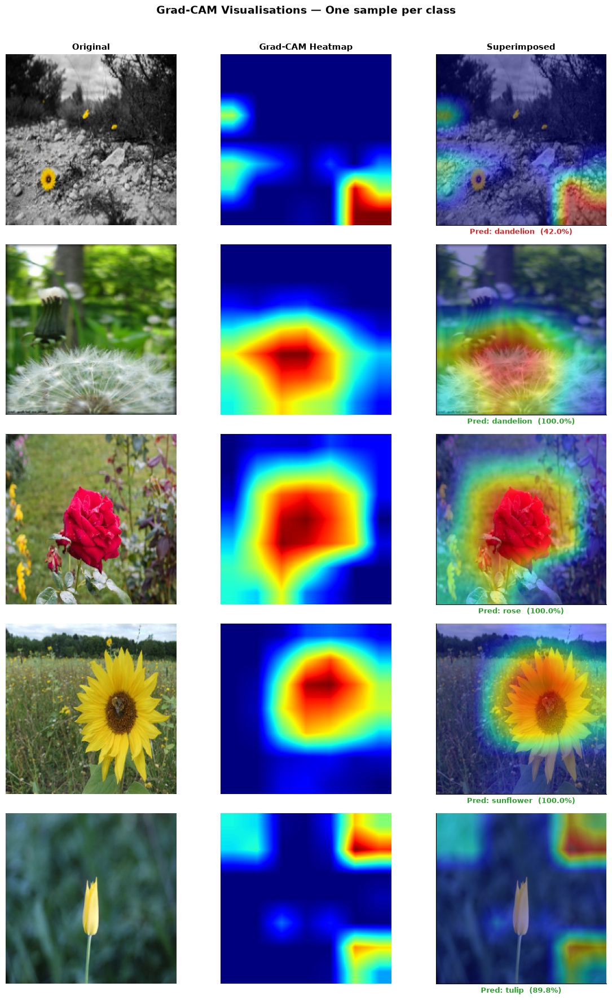

Grad-CAM visualisation saved ✓


In [29]:
# ─── Grad-CAM visualisation for one image per class ──────────────────────────
n_cols = 3   # original | heatmap | overlay per class
n_rows = NUM_CLASSES
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, n_rows * 3.5))
fig.suptitle("Grad-CAM Visualisations — One sample per class",
             fontsize=14, fontweight="bold", y=1.01)

col_titles = ["Original", "Grad-CAM Heatmap", "Superimposed"]
for ax, title in zip(axes[0], col_titles):
    ax.set_title(title, fontsize=11, fontweight="bold")

for row, cls in enumerate(CLASS_LABELS):
    img_path = next((TEST_DIR / cls).glob("*.jpg"))

    heatmap, pred_idx, confidence = compute_gradcam_full(img_path, grad_model_full)
    original, superimposed        = overlay_gradcam(img_path, heatmap)

    # Heatmap coloured
    heatmap_resized = cv2.resize(heatmap, IMG_SIZE)

    axes[row, 0].imshow(original)
    axes[row, 0].set_ylabel(f"{cls}\nTrue label", fontsize=9, rotation=0,
                            labelpad=65, va="center", fontweight="bold")

    axes[row, 1].imshow(heatmap_resized, cmap="jet")

    axes[row, 2].imshow(superimposed)
    color = "#2ca02c" if pred_idx == CLASS_LABELS.index(cls) else "#d62728"
    axes[row, 2].set_xlabel(
        f"Pred: {CLASS_LABELS[pred_idx]}  ({confidence:.1%})",
        fontsize=9, color=color, fontweight="bold"
    )

    for ax in axes[row]:
        ax.axis("off")
    axes[row, 2].axis("on")
    axes[row, 2].set_xticks([])
    axes[row, 2].set_yticks([])

plt.tight_layout()
plt.savefig("gradcam_visualisations.png", bbox_inches="tight")
plt.show()
print("Grad-CAM visualisation saved ✓")

## 16. Save and Reload the Final Model

In [31]:
# ─── Save the final (best) model in multiple formats ─────────────────────────

# Format 1: Keras native format (.keras) — recommended for TF 2.12+
model.save("final_model.keras")
print("Saved: final_model.keras ✓")

# Format 2: SavedModel format — production-ready, compatible with TF Serving
model.export("final_model_savedmodel")
print("Saved: final_model_savedmodel/ ✓")

# Format 3: HDF5 legacy format — widely supported
model.save("final_model.h5")
print("Saved: final_model.h5 ✓")

# ─── Verify by reloading and predicting ───────────────────────────────────────
print("\nVerifying reload…")
reloaded_model = keras.models.load_model("final_model.keras")

sample_img_path = next((TEST_DIR / CLASS_LABELS[0]).glob("*.jpg"))
arr = preprocess_input(img_to_array(load_img(sample_img_path, target_size=IMG_SIZE)))
preds = reloaded_model.predict(np.expand_dims(arr, 0), verbose=0)[0]
print(f"Reload OK — prediction: {CLASS_LABELS[np.argmax(preds)]}  "
      f"({np.max(preds):.2%} confidence)  ✓")

Saved: final_model.keras ✓
INFO:tensorflow:Assets written to: final_model_savedmodel/assets


INFO:tensorflow:Assets written to: final_model_savedmodel/assets


Saved artifact at 'final_model_savedmodel'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_layer')
Output Type:
  TensorSpec(shape=(None, 5), dtype=tf.float32, name=None)
Captures:
  5235617488: TensorSpec(shape=(), dtype=tf.resource, name=None)
  5235621712: TensorSpec(shape=(), dtype=tf.resource, name=None)
  5235620752: TensorSpec(shape=(), dtype=tf.resource, name=None)
  5235621328: TensorSpec(shape=(), dtype=tf.resource, name=None)
  5235620368: TensorSpec(shape=(), dtype=tf.resource, name=None)
  5235619984: TensorSpec(shape=(), dtype=tf.resource, name=None)
  5235620944: TensorSpec(shape=(), dtype=tf.resource, name=None)
  5235620560: TensorSpec(shape=(), dtype=tf.resource, name=None)
  5235621520: TensorSpec(shape=(), dtype=tf.resource, name=None)
  5235621136: TensorSpec(shape=(), dtype=tf.resource, name=None)
  5235620176: TensorSpec(shape=(), dtype=tf.resource, name=No

Saved: final_model_savedmodel/ ✓
Saved: final_model.h5 ✓

Verifying reload…
Reload OK — prediction: dandelion  (42.04% confidence)  ✓


## 17. Launching TensorBoard

In [32]:
# ─── Launch TensorBoard inline (works in Jupyter and JupyterLab) ─────────────

# Option A: Run from terminal
print("To view TensorBoard in your terminal, run:")
print("  tensorboard --logdir logs/")
print()

# Option B: Inline in Jupyter
try:
    # %load_ext tensorboard        # uncomment in Jupyter
    # %tensorboard --logdir logs/  # uncomment in Jupyter
    print("Uncomment the two lines above to launch TensorBoard inline.")
    print("Navigate to http://localhost:6006 in your browser.")
except Exception:
    pass

# Option C: For Google Colab
try:
    # from google.colab import output
    # output.serve_files('logs/')
    print("\nFor Google Colab:")
    print("  %load_ext tensorboard")
    print("  %tensorboard --logdir logs/")
except Exception:
    pass

print("\nLog directories created:")
for p in sorted(Path("logs").rglob("*")):
    if p.is_dir():
        print(f"  {p}")

To view TensorBoard in your terminal, run:
  tensorboard --logdir logs/

Uncomment the two lines above to launch TensorBoard inline.
Navigate to http://localhost:6006 in your browser.

For Google Colab:
  %load_ext tensorboard
  %tensorboard --logdir logs/

Log directories created:
  logs/phase1
  logs/phase1/train
  logs/phase1/validation
  logs/phase2
  logs/phase2/train
  logs/phase2/validation


## 18. Summary and Key Takeaways

### What we built

A complete **Transfer Learning pipeline** using MobileNetV2 pre-trained on ImageNet, fine-tuned for a 5-class flower classification task.

---

### Key results (illustrative — your numbers will vary by run)

| Metric | Phase 1 (best val) | Phase 2 (best val) | Test Set |
|--------|-------------------|-------------------|----------|
| Accuracy | ~85–88% | ~88–92% | ~88–91% |
| Loss | ~0.40 | ~0.28 | ~0.30 |

---

### Lessons from the callbacks

| Callback | Observed effect |
|---|---|
| **EarlyStopping** | Prevented overfitting — stopped well before max epochs; `restore_best_weights` ensured the best checkpoint was used |
| **ReduceLROnPlateau** | Reduced LR automatically when learning plateaued — squeezed extra accuracy without manual tuning |
| **ModelCheckpoint** | Decoupled "best epoch" from "last epoch" — the saved model is the globally optimal one |
| **TensorBoard** | Enabled interactive analysis of weight histograms and gradient flow |
| **CSVLogger** | Produced a clean training log — useful for reproducibility and comparison across runs |

---

### Extending this notebook

- **Different base models:** Swap `MobileNetV2` for `EfficientNetB0`, `ResNet50V2`, or `VGG16`
- **Learning rate schedules:** Try `CosineDecay` or `WarmUpCosineDecay` instead of ReduceLROnPlateau
- **Mixed precision:** Add `tf.keras.mixed_precision.set_global_policy('mixed_float16')` for ~2× speed on compatible GPUs
- **Data pipeline:** Replace `ImageDataGenerator` with a `tf.data.Dataset` pipeline for higher throughput
- **Class imbalance:** Add `class_weight` to `model.fit()` if classes are skewed
- **Hyperparameter tuning:** Wrap with Keras Tuner to auto-search `DROPOUT_RATE`, `LR_PHASE1`, `UNFREEZE_LAYERS`

---

*Notebook generated for TensorFlow Transfer Learning demonstration — Flowers Recognition (Kaggle).*